
<style>
@page { size: A4 portrait; margin: 12mm; }
@media print {
  .jp-Cell, .cell, .jp-OutputArea, .output, figure, img, canvas, svg, table, pre {
    break-inside: avoid !important; page-break-inside: avoid !important;
  }
  h1, h2, h3 { page-break-after: avoid; }
  * { -webkit-print-color-adjust: exact !important; print-color-adjust: exact !important; }
}
</style>


# Clinical Dataset Exploration Explanation Notebook

narrative of `clinica/clinica_data_exploration.ipynb`.

## 1. Objectives and Dataset

- Goal: characterize PD vs MSA (MSA-P, MSA-C) clinically; surface discriminative variables; prepare for integration with imaging models.
- Classes considered: MSA-P, MSA-C,PD (MSA-P and MSA-C are sometimes merged as MSA).


## 1.1 Legend


| Column                                                         | Type        | Short explanation                                                                |
| :------------------------------------------------------------- | :---------- | :------------------------------------------------------------------------------- |
| anni_dalla_diagnosi                                            | numeric     | Years elapsed since formal diagnosis.                                            |
| anni_dopaminoaagonisti                                         | numeric     | Duration of dopamine-agonist therapy (years).                                    |
| anni_l_dopa                                                    | numeric     | Duration of levodopa therapy (years).                                            |
| anno_diagnosi                                                  | numeric     | Calendar year of diagnosis.                                                      |
| anno_esordio_disautonomia                                      | numeric     | Year of first autonomic symptom.                                                 |
| anno_esordio_sintomi_motori                                    | numeric     | Year of first motor symptom.                                                     |
| anno_esordio_sintomi_non_motori                                | numeric     | Year of first non-motor symptom.                                                 |
| anno_nascita                                                   | numeric     | Year of birth.                                                                   |
| compass_gi                                                     | numeric     | COMPASS-31 gastrointestinal sub-score.                                           |
| compass_oh                                                     | numeric     | COMPASS-31 orthostatic hypotension sub-score.                                    |
| compass_pupil                                                  | numeric     | COMPASS-31 pupillomotor sub-score.                                               |
| compass_sudor                                                  | numeric     | COMPASS-31 sudomotor (sweating) sub-score.                                       |
| compass_totale                                                 | numeric     | Total COMPASS-31 autonomic dysfunction score.                                    |
| compass_uin                                                    | numeric     | COMPASS-31 urinary sub-score.                                                    |
| compass_vasc                                                   | numeric     | COMPASS-31 vasomotor sub-score.                                                  |
| delta_off_on                                                   | numeric     | Difference between UPDRS_OFF and UPDRS_ON (treatment effect).                    |
| durata_malattia                                                | numeric     | Disease duration from onset (years).                                             |
| eta_attuale                                                    | numeric     | Current patient age.                                                             |
| eta_diagnosi                                                   | numeric     | Age at diagnosis.                                                                |
| eta_esordio                                                    | numeric     | Age at first motor symptom.                                                      |
| h_and_y                                                        | numeric     | Hoehn & Yahr stage (1–5).                                                        |
| ledd                                                           | numeric     | Levodopa equivalent daily dose (mg/day).                                         |
| ledd_per_anno                                                  | numeric     | LEDD normalized per year of disease.                                             |
| n_anomalie_mri                                                 | numeric     | Number of abnormal MRI findings.                                                 |
| n_red_flags_msa                                                | numeric     | Count of MSA “red-flag” features (per MDS).                                      |
| n_red_flags_msa_clinic_certified                               | numeric     | Clinically certified number of red flags.                                        |
| parkinsonism                                                   | numeric     | Severity/composite score of parkinsonian signs (rigidity, bradykinesia, tremor). |
| percentuale_risposta_ldopa                                     | numeric     | % improvement after acute L-Dopa test.                                           |
| progression_rate                                               | numeric     | Calculated progression speed (e.g. H&Y / disease years).                         |
| ritardo_diagnostico                                            | numeric     | Diagnostic delay (years from symptom onset to diagnosis).                        |
| updrs_off                                                      | numeric     | UPDRS-III motor score in OFF-medication state.                                   |
| updrs_on                                                       | numeric     | UPDRS-III motor score in ON-medication state.                                    |
| atrofia_cervelletto                                            | binary      | MRI: cerebellar atrophy.                                                         |
| atrofia_del_putamen                                            | binary      | MRI: putaminal atrophy.                                                          |
| atrofia_peduncoli_cerebellari_medi                             | binary      | MRI: middle cerebellar peduncle atrophy.                                         |
| atrofia_ponte                                                  | binary      | MRI: pontine atrophy.                                                            |
| behavioural_alteration                                         | binary      | Behavioural or personality changes.                                              |
| caduta_segnale_putamen                                         | binary      | MRI: putaminal signal loss on T2*/SWI.                                           |
| cadute                                                         | binary      | History of falls.                                                                |
| carrozzina                                                     | binary      | Wheelchair use.                                                                  |
| cerebellar_syndrome                                            | binary      | Presence of cerebellar signs (ataxia, dysmetria).                                |
| cognitive_decline                                              | binary      | Cognitive impairment or dementia.                                                |
| cold_discolored_hands_and_feet                                 | binary      | Peripheral vasomotor disturbance (autonomic).                                    |
| constipation                                                   | binary      | Chronic constipation.                                                            |
| craniocervical_dyst_induced_dy_l_dopa                          | binary      | Craniocervical dystonia induced by L-Dopa.                                       |
| deambulaz_appoggio                                             | binary      | Ambulates with support.                                                          |
| deambulaz_autonoma                                             | binary      | Ambulates independently.                                                         |
| drooling                                                       | binary      | Hypersalivation / drooling.                                                      |
| erectile_disfunction                                           | binary      | Erectile dysfunction (autonomic symptom).                                        |
| fatigue                                                        | binary      | Fatigue / lack of energy.                                                        |
| hot_cross_bun_sign                                             | binary      | MRI: pontine cruciform hyperintensity typical of MSA-C.                          |
| hyposmia                                                       | binary      | Reduced sense of smell.                                                          |
| inspiratory_sighs                                              | binary      | Sighing or irregular breathing pattern.                                          |
| iperintensita_peduncoli_cerebellari_medi                       | binary      | MRI: MCP hyperintensity.                                                         |
| iperintensita_putamen                                          | binary      | MRI: putaminal hyperintensity.                                                   |
| jerky_myoclonic_postural_or_kinetic_tremor                     | binary      | Irregular / jerky tremor type.                                                   |
| moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset | binary      | Postural instability within 3 years of motor onset.                              |
| normal_rmn                                                     | binary      | Normal brain MRI.                                                                |
| pain                                                           | binary      | Chronic or neuropathic pain.                                                     |
| pathologic_laughter_or_crying                                  | binary      | Emotional incontinence (pseudobulbar affect).                                    |
| poor_l_dopa_responsivenes                                      | binary      | Poor or absent clinical response to L-Dopa.                                      |
| postural_deformities                                           | binary      | Axial/postural deformities (camptocormia, Pisa).                                 |
| rapid_progression_w_3_yrs                                      | binary      | Rapid disease progression within 3 years.                                        |
| rbd                                                            | binary      | REM sleep behavior disorder.                                                     |
| russamento_osas                                                | binary      | Snoring / sleep apnea (OSAS).                                                    |
| severe_dysphagia_w_3_yrs                                       | binary      | Severe dysphagia within 3 years of onset.                                        |
| severe_speech_impairement_w_3_yrs                              | binary      | Severe dysarthria within 3 years of onset.                                       |
| sonnolenza_diurna                                              | binary      | Excessive daytime sleepiness.                                                    |
| stridor                                                        | binary      | Laryngeal stridor (inspiratory noise).                                           |
| unexplained_babinski                                           | binary      | Pathological Babinski sign unexplained by stroke.                                |
| unexplained_urinary_urge_incontinence                          | binary      | Urinary urge incontinence unexplained by obstruction.                            |
| unexplained_voiding_difficulties                               | binary      | Urinary retention / difficulty voiding unexplained by prostate disease.          |
| visual_alteration                                              | binary      | Visual disturbances or blurring.                                                 |
| anamnestic_oh                                                  | binary      | History of orthostatic hypotension from anamnesis.                               |
| diagnosi_definita                                              | categorical | Final confirmed diagnosis (PD / MSA-P / MSA-C / Control).                        |
| diagnosi_di_invio                                              | categorical | Referral diagnosis at first evaluation.                                          |
| gruppo_eta                                                     | categorical | Age group (e.g. <50, 50-60, 60-70, >70).                                         |
| sesso                                                          | categorical | Sex (M/F).                                                                       |
| stadio_malattia                                                | categorical | Disease stage grouping (e.g. early / mid / late).                                |
| data_di_nascita                                                | date        | Full birth date.                                                                 |


pointed by Grazia

| **Set**                           | **Variables Included**                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             |
| --------------------------------- | ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------                                                                                                                                                                          |
| **Clinician-Certified MSA Red Flags** | `poor_l_dopa_responsivenes`, `rapid_progression_w_3_yrs`, `moderate_to_severe_postural_instability_w_3_yrs_of_motor_onset`, `craniocervical_dyst_induced_dy_l_dopa`, `severe_speech_impairement_w_3_yrs`, `severe_dysphagia_w_3_yrs`, `unexplained_babinski`, `jerky_myoclonic_postural_or_kinetic_tremor`, `postural_deformities`, `unexplained_voiding_difficulties`, `unexplained_urinary_urge_incontinence`, `stridor`, `inspiratory_sighs`, `cold_discolored_hands_and_feet`, `pathologic_laughter_or_crying` |


## 2. Data Ingestion and Harmonization

- Load clinical csv (harmonizing different rapresentations of missing values to Nan)
- Column names normalized: Unicode stripped, whitespace collapsed, then slugified to ASCII snake_case.
- Diagnosis labels trimmed and harmonized (e.g., `MSA-P/C` → `MSA-P`).
- Numeric casting based on patterns; categorical cleaning (uppercasing, NA handling).
- Duplicates check


## 3. Missingness Profiling

- Quantify missingness per variable per class to guide usable features.


<!-- 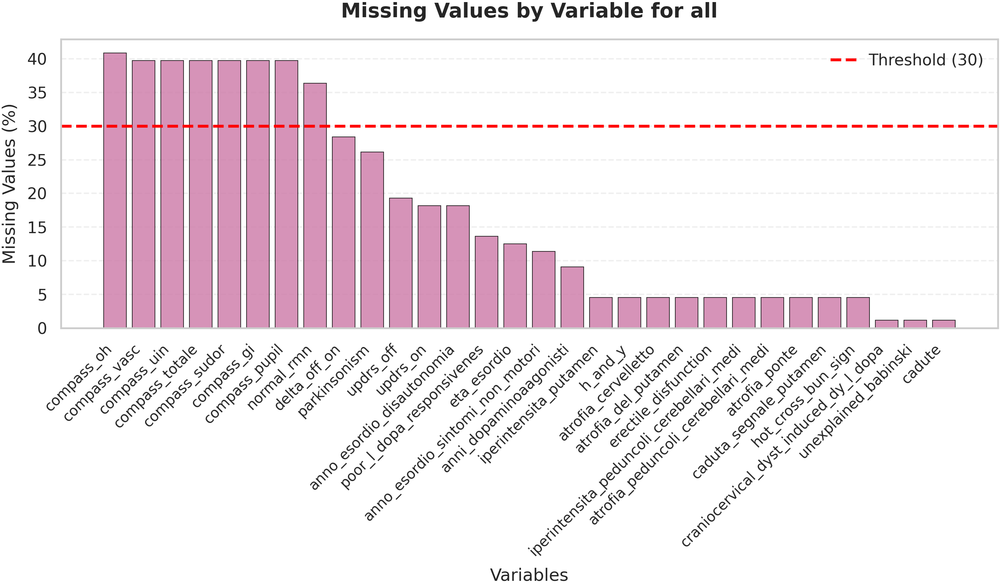 -->
<!-- 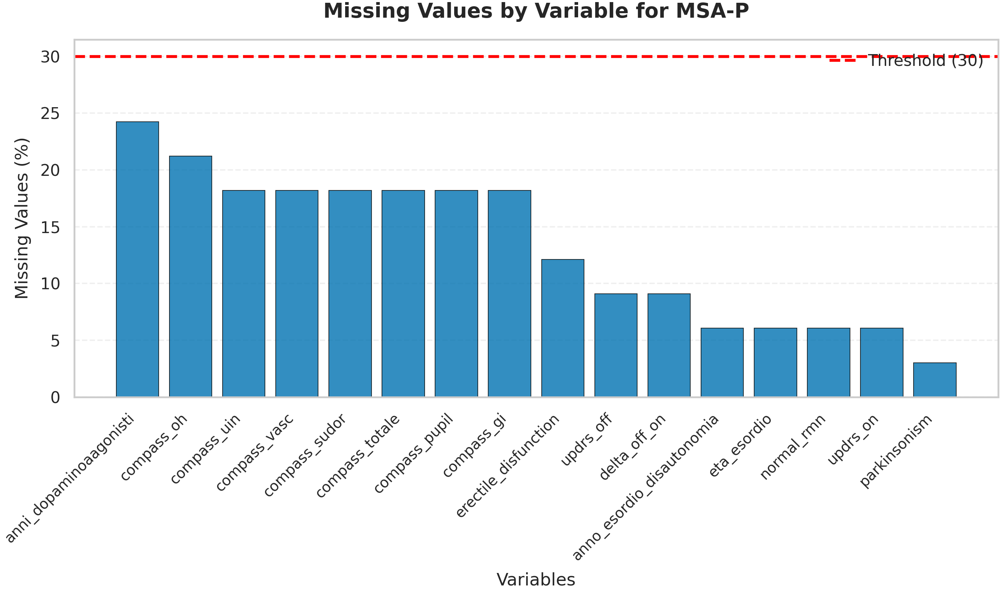 -->
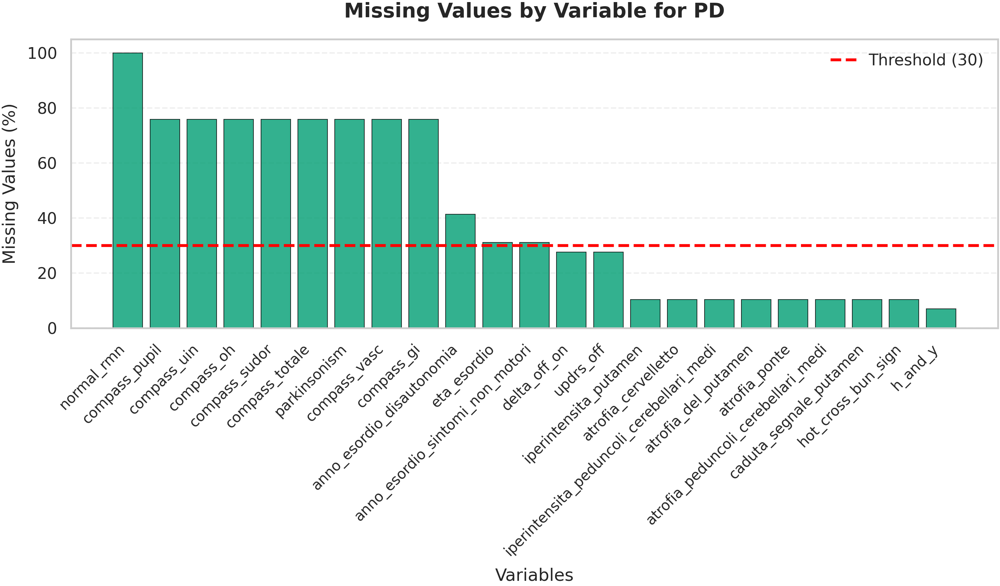
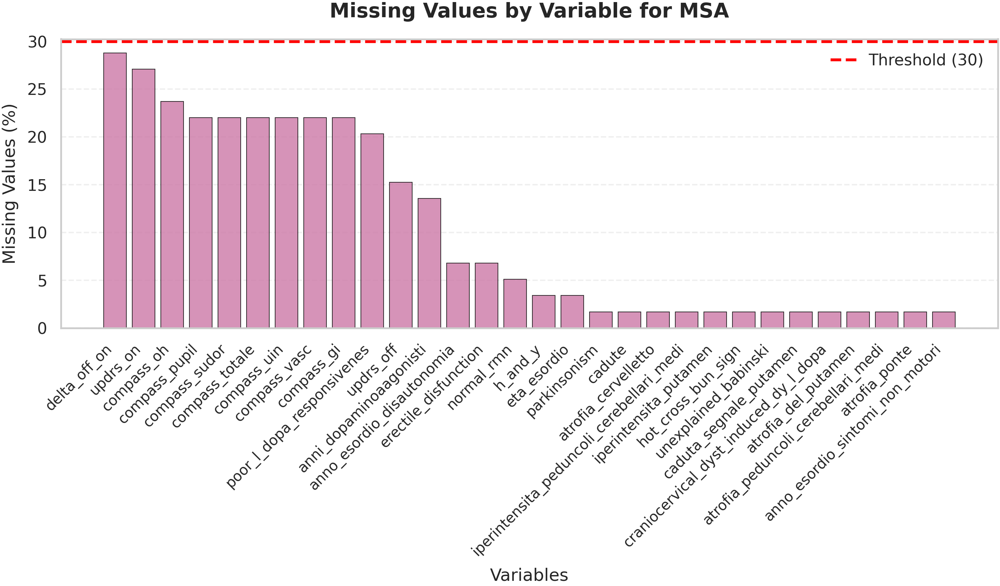

<div style="background-color: rgba(33, 150, 243, 0.15); border-left: 6px solid #2196F3; padding: 10px; margin: 10px 0; color: inherit;">
<strong>📝 NOTE:</strong> which thrashold do i keep?
</div>

<div style="background-color: rgba(220, 53, 69, 0.15); border-left: 6px solid #DC3545; padding: 10px; margin: 10px 0; color: inherit;">
<strong>🚨 IMPORTANT:</strong> Note that PD has much more missings
</div>


**Remaining columns after removal of high missing columns**

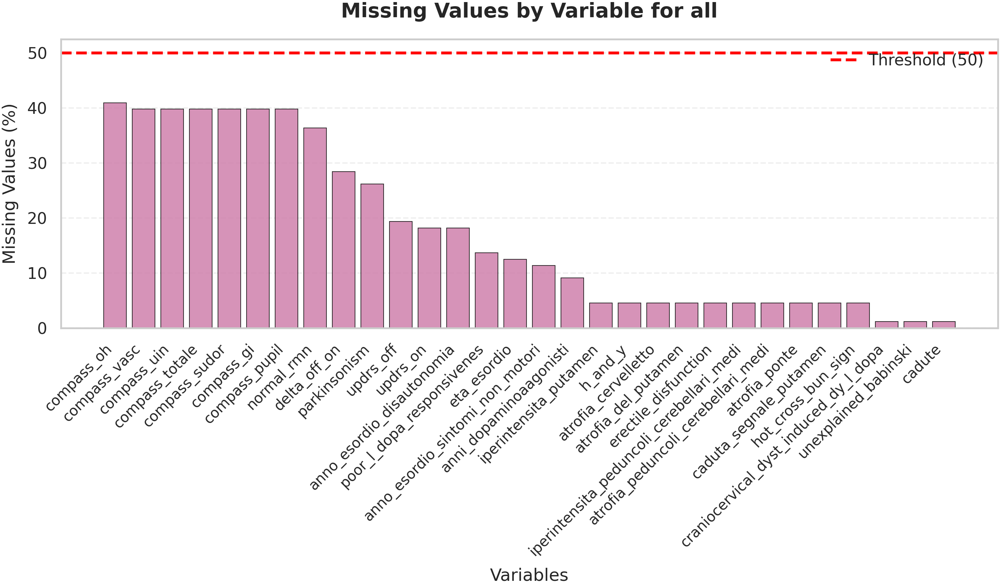

## 4. Derived Variables and Cleaning

- Create analysis-friendly fields (examples):
  - Timing/severity: `eta_attuale`, `eta_esordio`, `durata_malattia`, `percentuale_risposta_ldopa`.
  - Aggregates: `n_red_flags_msa`, `n_anomalie_mri` as the sum of the corresponding binary symptoms columns


| Variable                               | Short description                                                      |
|---------------------------------------:|------------------------------------------------------------------------|
| eta_attuale                            | Current patient age.                                                   |
| ritardo_diagnostico                    | Diagnostic delay (years from symptom onset to diagnosis).              |
| anni_dalla_diagnosi                    | Years elapsed since formal diagnosis.                                  |
| percentuale_risposta_ldopa             | % improvement after acute L‑Dopa test.                                 |
| ledd_per_anno                          | Levodopa equivalent daily dose normalized per year of disease.         |
| n_red_flags_msa                        | Count of MSA “red-flag” AI generated.                            |
| n_red_flags_msa_clinic_certified       | Clinically certified count od MSA red flags.                              |
| n_anomalie_mri                         | Number of abnormal MRI findings.                                       |
| stadio_malattia                        | Disease stage grouping (e.g. early / mid / late).                      |
| gruppo_eta                             | Age group (e.g. <50, 50-60, 60-70, >70).                               |
| progression_rate                       | Calculated progression speed (e.g. H&Y / disease years).               |

## 5. Outlier Detection

- Use Tukey's fences on key continuous variable to spot extreme values.
- Provides a record of suspected outliers for clinician review.

**Method**: Tukey's Fences
- Lower fence = Q1 − 1.5 × IQR  
- Upper fence = Q3 + 1.5 × IQR
- Values outside these fences are flagged as outliers

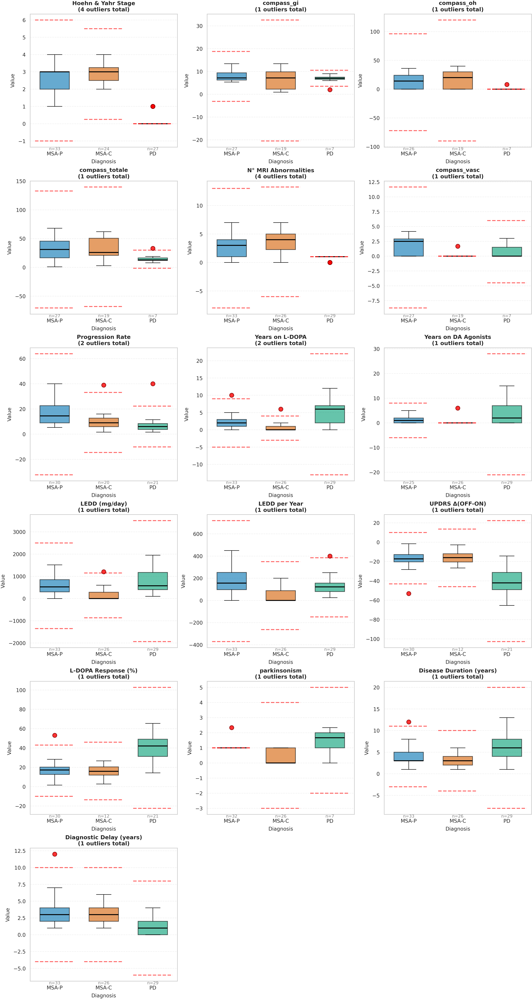
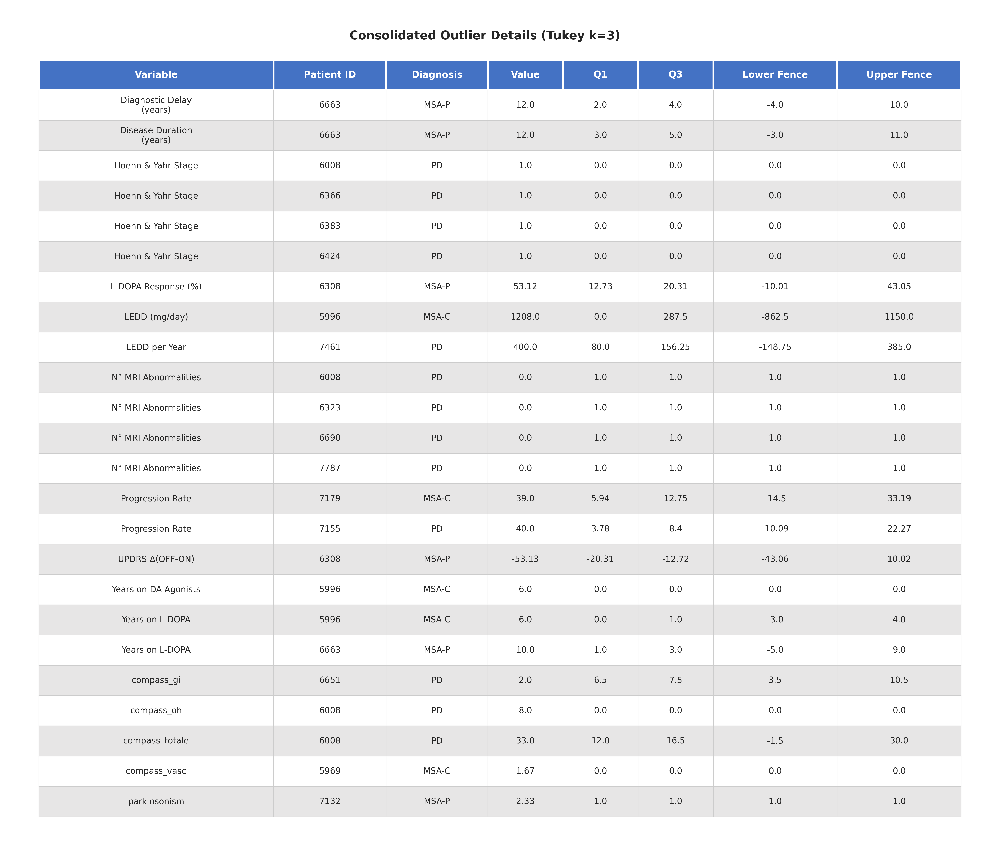 


<div style="background-color: rgba(255, 193, 7, 0.15); border-left: 6px solid #FFC107; padding: 10px; margin: 10px 0; color: inherit;">
<strong>⚠️ TODO:</strong> Make clinician verify outliers and decide what to do with those
</div>

## 6. Cohort Overview

- Distribution of patients across definitive diagnoses.
- A compact summary table (N, M/F, age at onset, duration, current age).

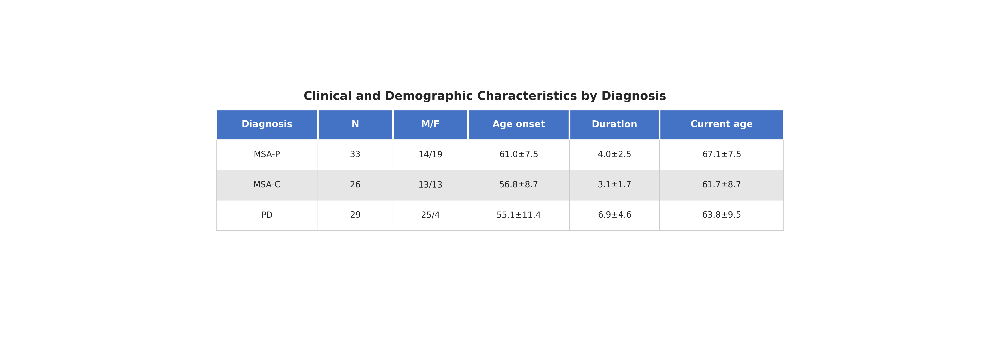
<br>

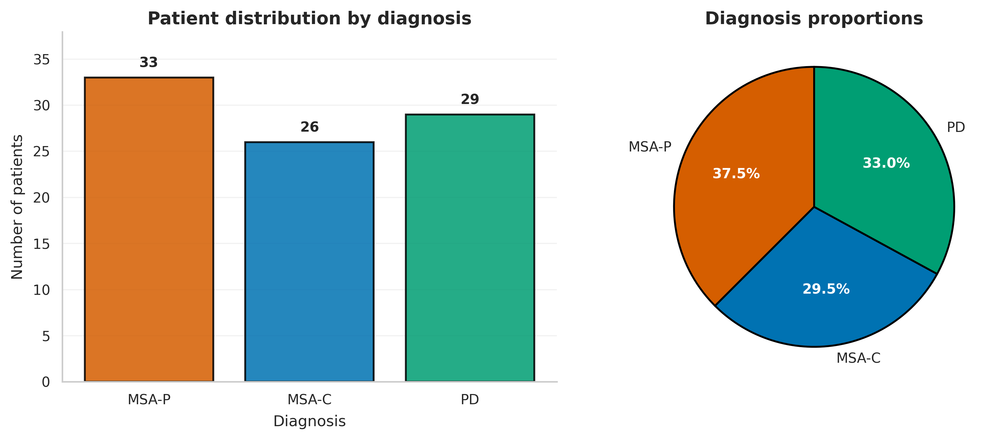

<div style="background-color: rgba(220, 53, 69, 0.15); border-left: 6px solid #DC3545; padding: 10px; margin: 10px 0; color: inherit;">
<strong>🚨 WARNING:</strong> PD patients are predominantly males
</div>



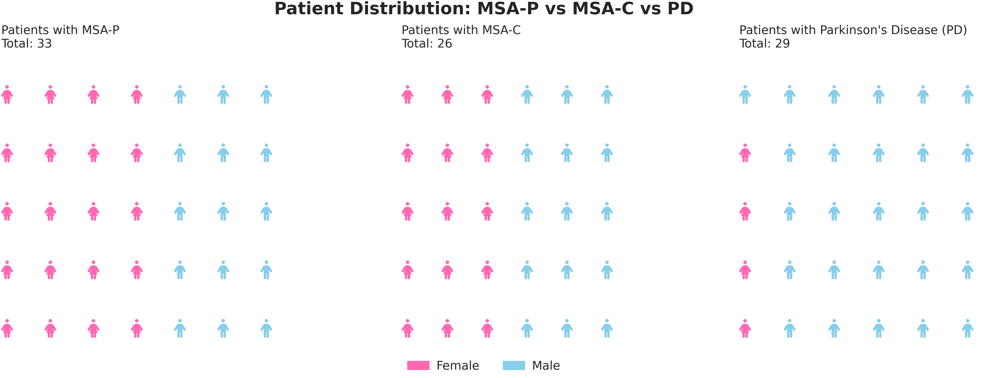

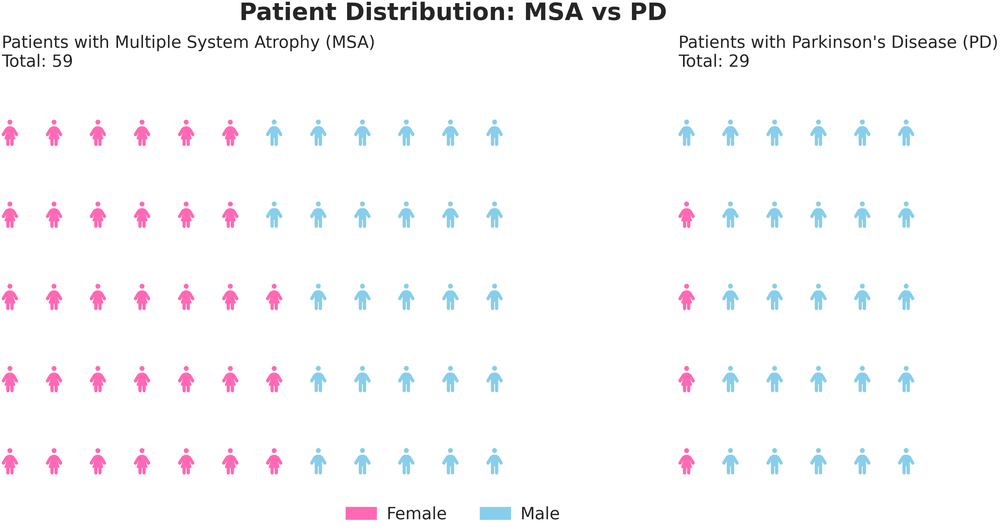

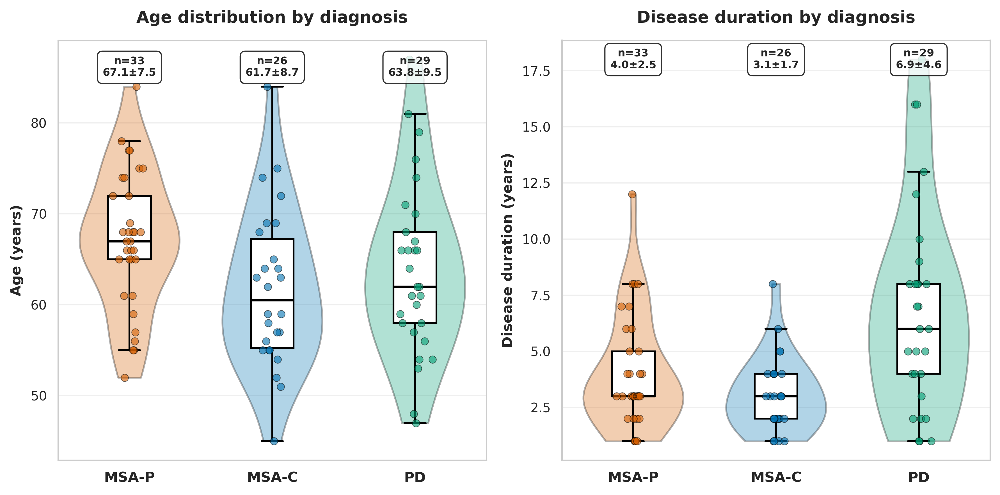
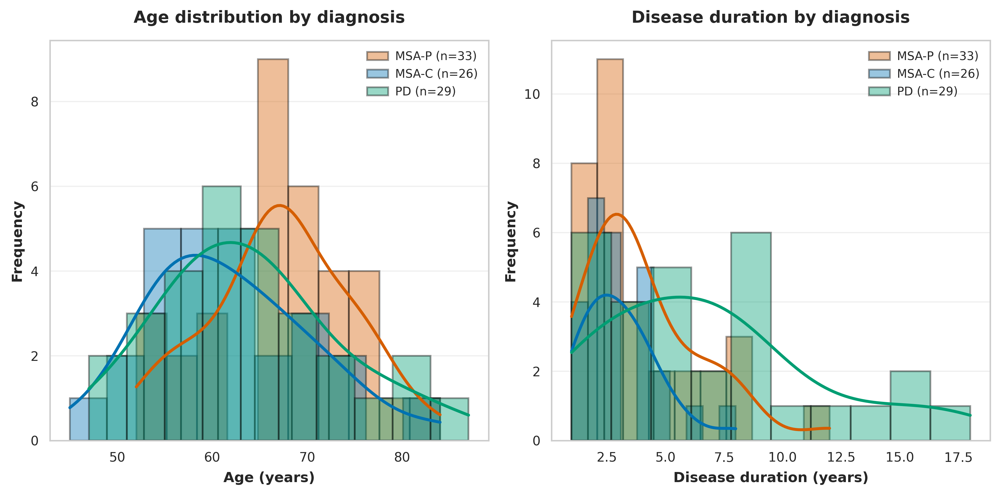

## 7. Multi-symtoms clusters and Co-occurrence

This analysis identifies and visualizes patterns of symptom co-occurrence within each diagnostic group (MSA-P, MSA-C, PD) to reveal characteristic multi-symptom profiles that may aid differential diagnosis.

**Rationale:**
While univariate symptom prevalence identifies individual discriminators, parkinsonian syndromes are clinically characterized by specific constellations of concurrent symptoms.

<!-- 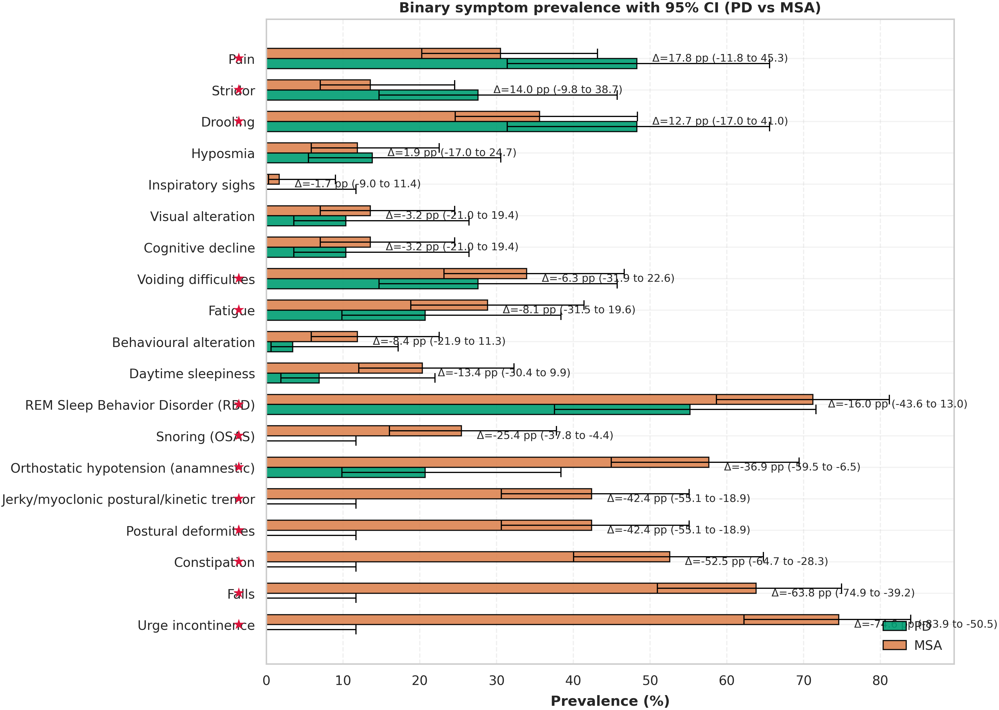 -->

<!-- 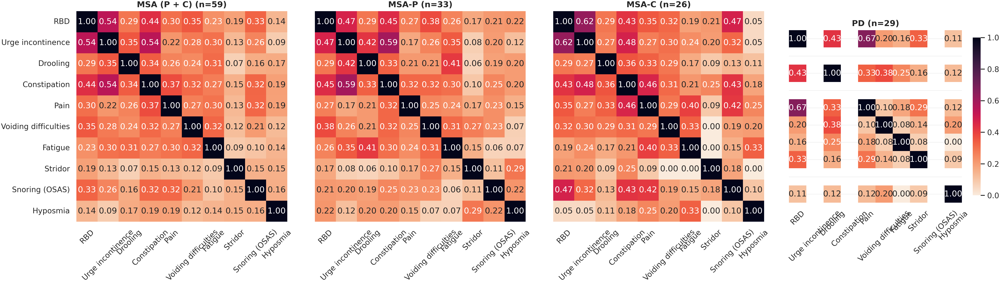 -->


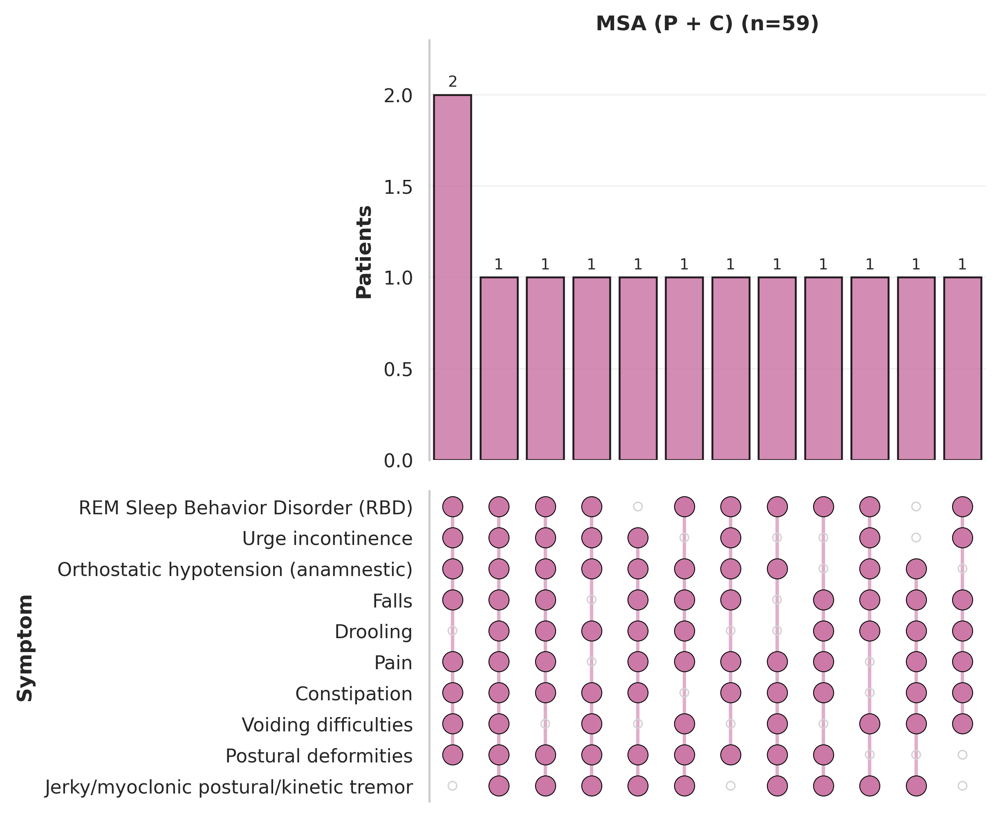

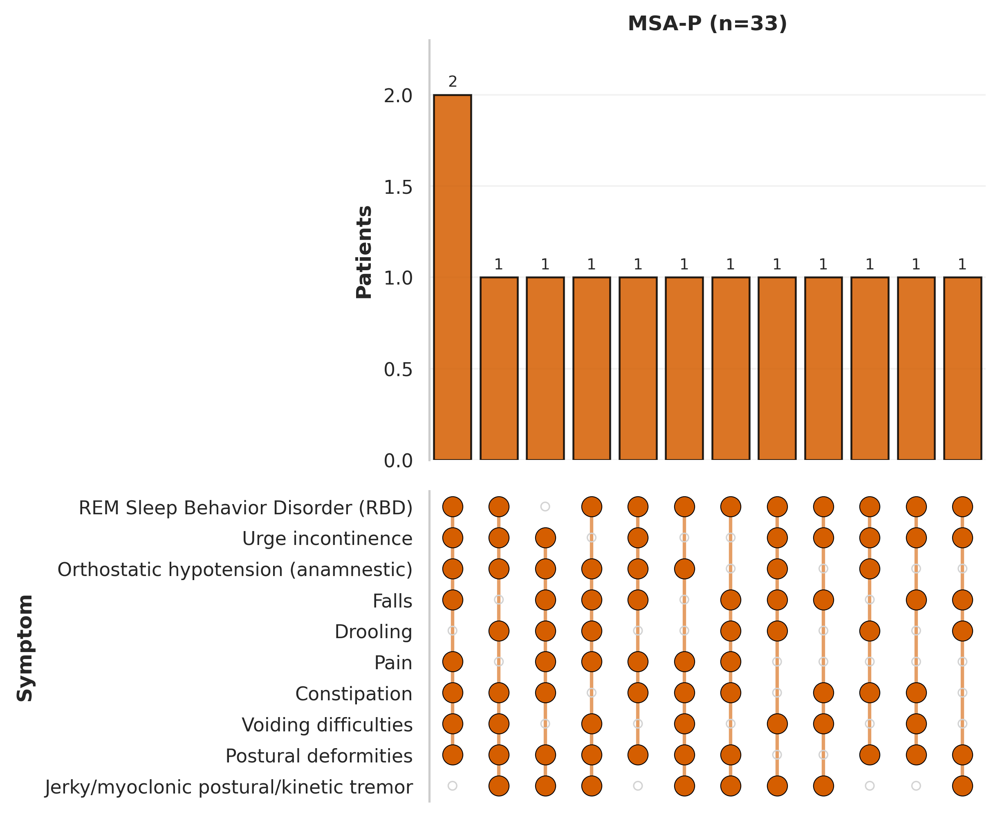

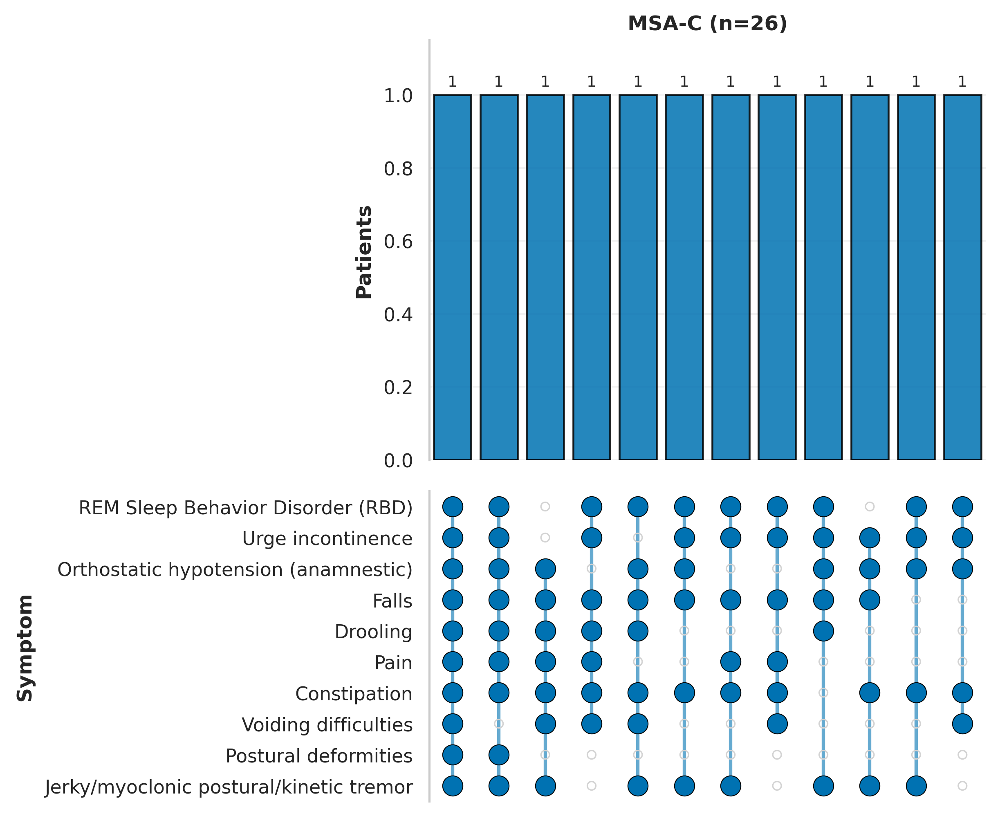

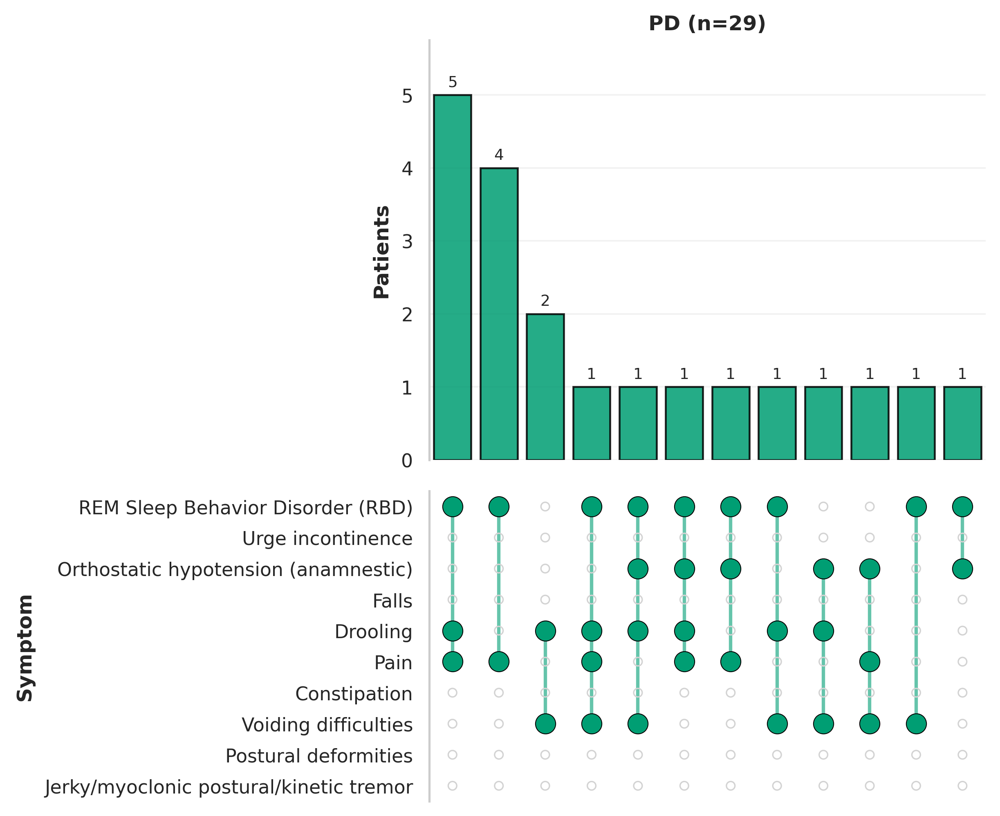

## 7.1 symptoms co-occurence heatmaps

This analysis quantifies pairwise symptom co-occurrence within each diagnostic group using the Jaccard similarity coefficient, revealing which symptoms tend to appear together in **individual patients**.

**Methods:**
- **Jaccard index**: For each symptom pair, computed as the ratio of co-occurrence (intersection) to total presence (union): J(A,B) = |A ∩ B| / |A ∪ B|
- **Scale**: Ranges from 0 (symptoms never co-occur) to 1 (perfect overlap—every patient with symptom A also has symptom B, and vice versa)

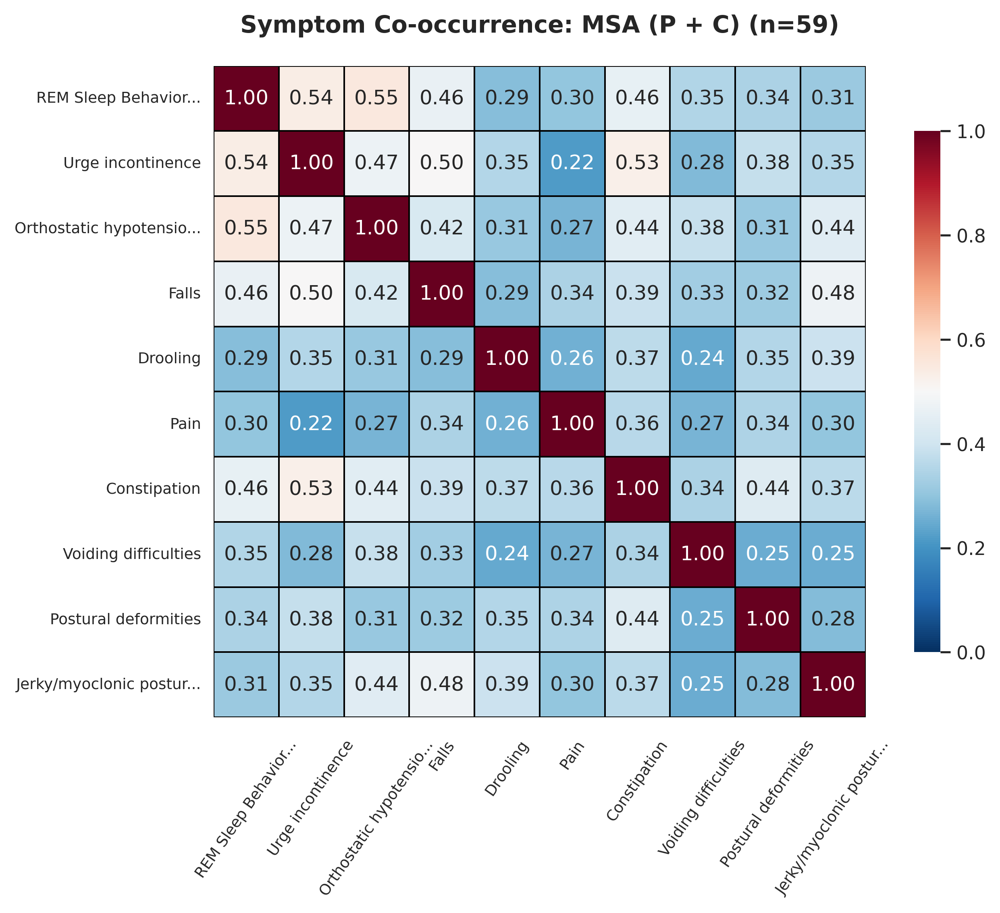

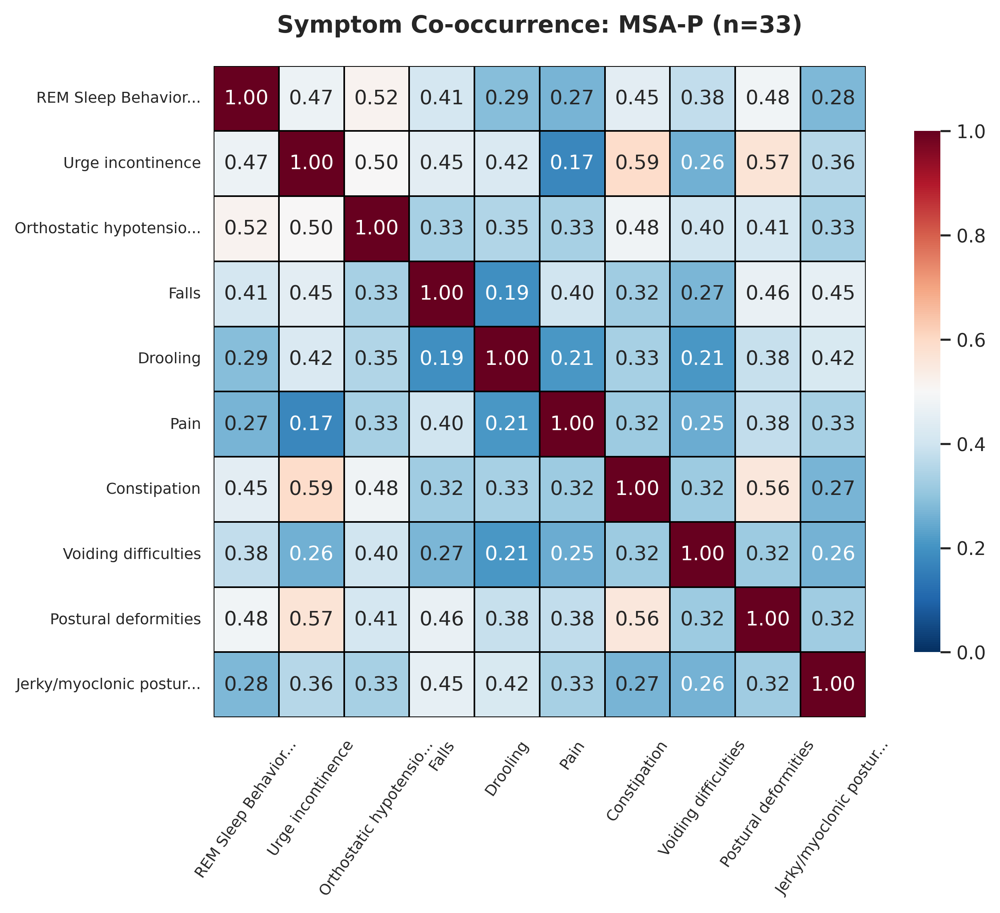

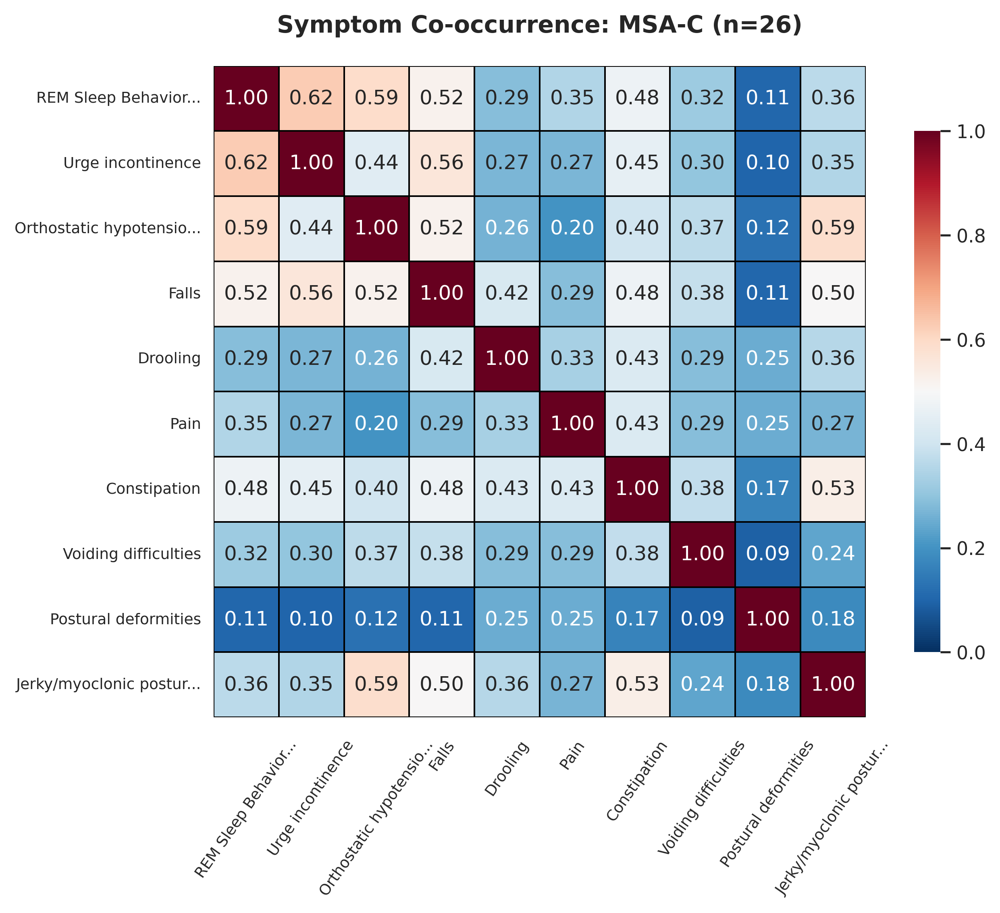

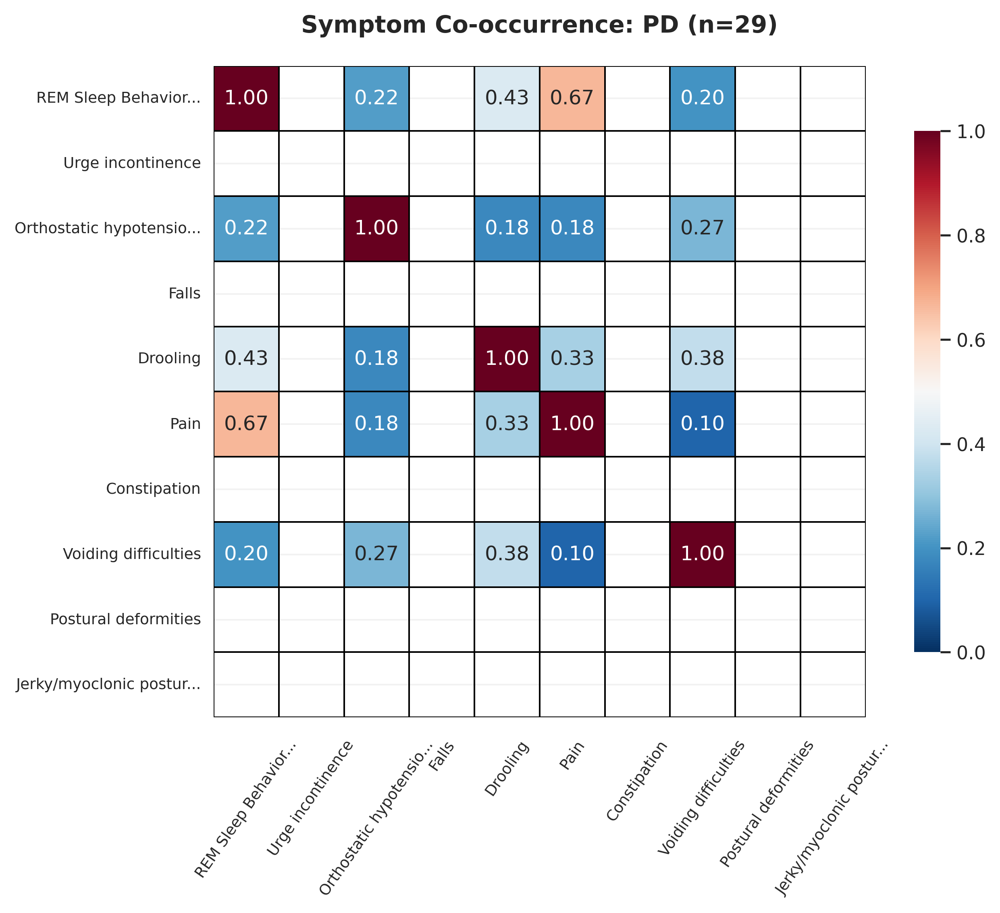

<div style="background-color: rgba(33, 150, 243, 0.15); border-left: 6px solid #2196F3; padding: 10px; margin: 10px 0; color: inherit;">
<strong>📝 NOTE:</strong> PD heatmaps lacks columns of the symptoms which are always not expressed (ie set to 0)

## 8. Motor Function and L‑Dopa Responsiveness
**Objective:** Compare motor severity (UPDRS OFF) and treatment response across diagnoses. higher UPDRS values means severe motor impairment

**Clinical Relevance:**
- **UPDRS OFF score:** Measures motor impairment without medication, reflecting disease severity
- **L-dopa responsiveness:** **KEY DIAGNOSTIC CRITERION** distinguishing MSA from PD
  - PD: Typically >30% improvement with L-dopa (good response)
  - MSA: Poor L-dopa response (<30% improvement) is a core diagnostic feature

**Clinical Importance:**
This is one of the most critical clinical differentiators between MSA and PD

**Expected Findings:**
- Similar or higher UPDRS OFF scores in MSA (more severe motor impairment)
- Significantly lower L-dopa response in MSA vs. PD
- High inter-individual variability, especially in MSA

**Results**
- expected finding one and two are respected (can also be seen by the slope of the graph plotting values of UPDRS OFF and ON)
- although MSA-P presents outliers it doesnt show higher variability than PD

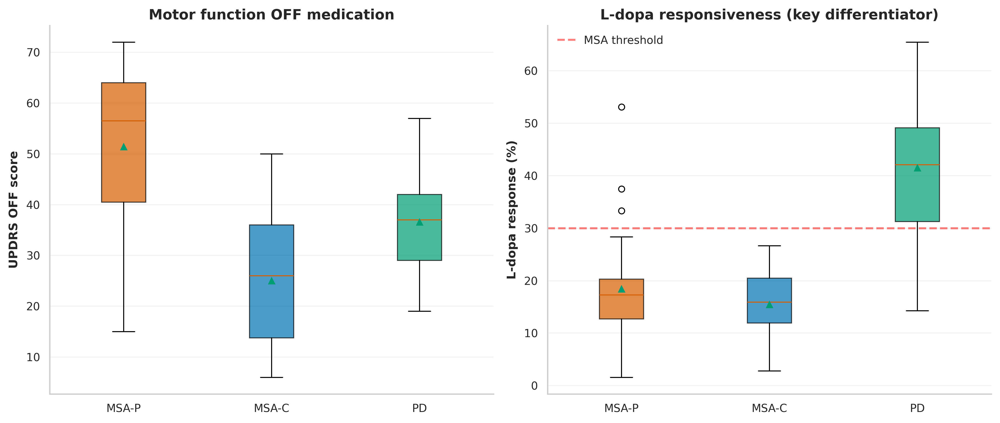

<!-- 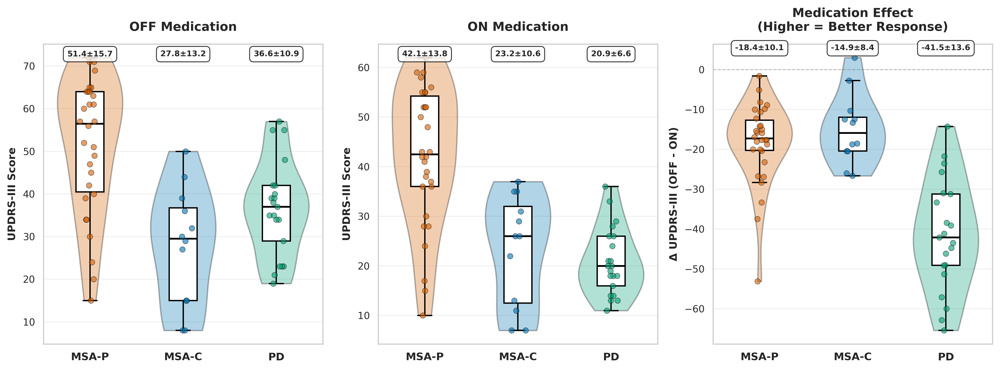 -->

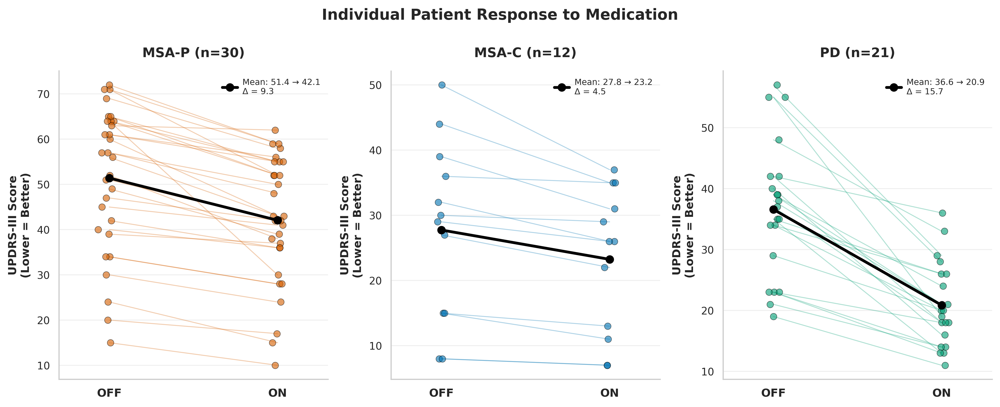



## 9. MSA Red Flags and Hoehn & Yahr Severity

**Objective:** Quantify MSA-specific clinical red flags and assess disease staging.

**Clinical Relevance:**
- **Red flags:** Clinical features suggestive of MSA (e.g., rapid progression, early autonomic failure, poor L-dopa response, cerebellar signs)
- **Hoehn & Yahr (H&Y) staging:** Standard PD staging system (0-5), also applicable to parkinsonian disorders
  - Stage 1-2: Unilateral/bilateral involvement, no balance impairment
  - Stage 3: Balance impairment, physically independent
  - Stage 4-5: Severe disability, wheelchair-bound

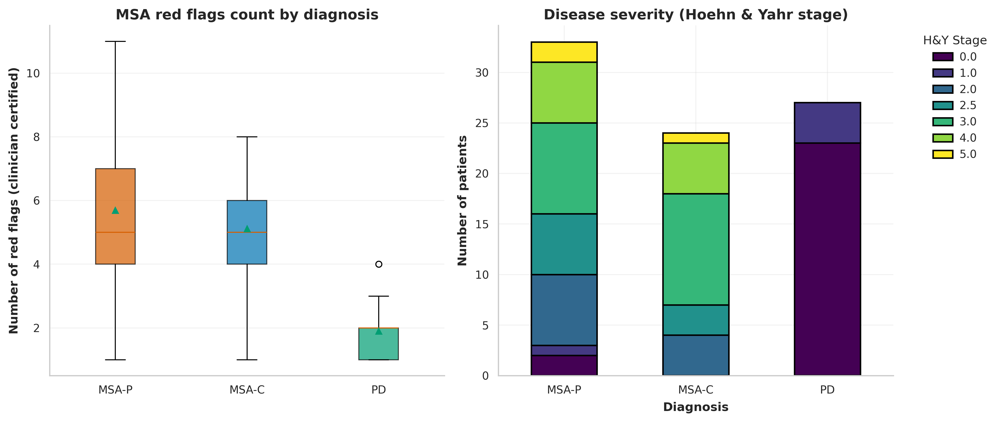


<div style="background-color: rgba(220, 53, 69, 0.15); border-left: 6px solid #DC3545; padding: 10px; margin: 10px 0; color: inherit;">
<strong>🚨 IMPORTANT:</strong> MSA patients are overwhelmingly in worse disease stages than PD ones
</div>


## 10. Diagnostic Delay and Progression

**Objective:** Quantify time from symptom onset to diagnosis and calculate progression rates.

**Clinical Relevance:**
- **Diagnostic delay:** Time between symptom onset and formal diagnosis
  - Reflects diagnostic complexity and symptom overlap between conditions
  - Longer delays may indicate atypical presentations
- **Progression rate:** Speed of clinical decline (e.g., H&Y stage change per year)
  - MSA progresses faster than PD (key differentiator)
  - Rapid progression within 3 years is an MSA red flag

**Expected Findings:**
- MSA may show longer diagnostic delays due to initial misdiagnosis as PD
- MSA demonstrates faster progression rates than PD
- High variability in both measures reflects diagnostic complexity

**Results Analysis**
- all expected findings are respected
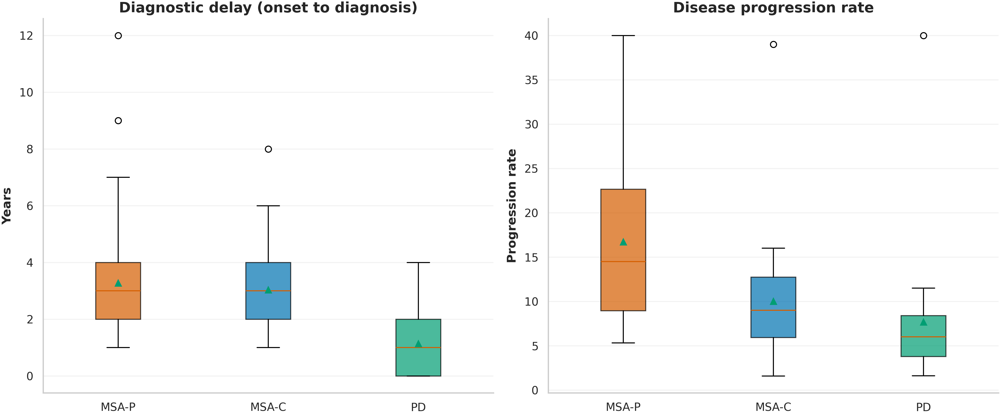


## 11. MRI Abnormalities (Supportive Features)

- Total abnormality count by diagnosis; specific signs: hot‑cross‑bun, putamen atrophy/signal changes.
- Clinical reading: MSA‑C shows pontocerebellar signs; MSA‑P shows putaminal changes; PD often near-normal MRI.

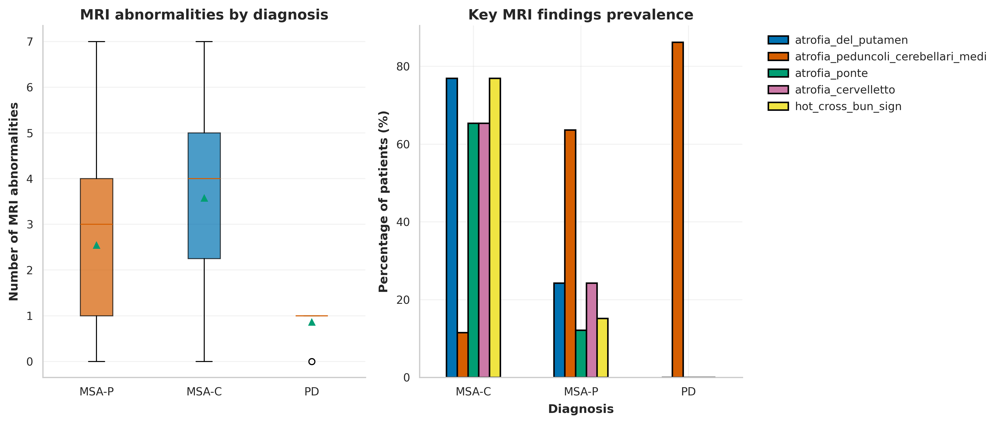


## 12. Autonomic Dysfunction Profile (COMPASS)

- Compare subscales COMPASS across classes.

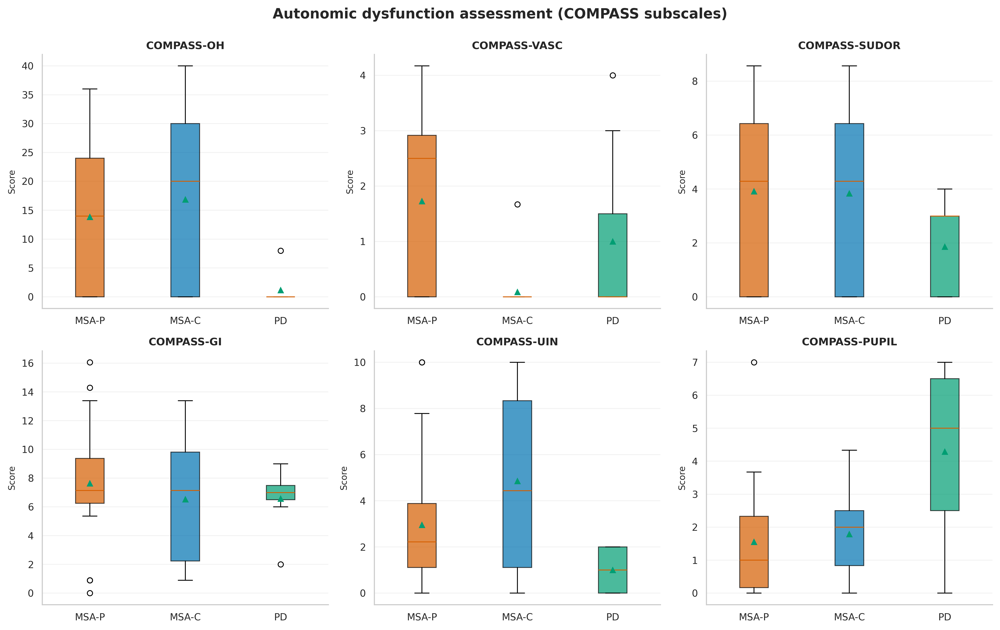


<div style="background-color: rgba(220, 53, 69, 0.15); border-left: 6px solid #DC3545; padding: 10px; margin: 10px 0; color: inherit;">
<strong>🚨 IMPORTANT:</strong> COMPASS is a high missing value (almost 40%) expecially for PD patients where almost 80% of them do not have a compass value
</div>

## 13. Univariate Screening and Mutual Information

Since the dataset contains both continouse (with different distribution) and categorical features proper statistical tests on early diagnoses features (ie features that a patient could present before being diagnosed/at first clinical visit) to understand which of those are statistically more relevant to distinguish diagnoses class and could potentially be integrated into a ML model.

- For each feature: appropriate test (ANOVA/Welch/Kruskal for continuous (decision based on feature distribution ie if they respect normality and homoschedacity); Chi‑square for binary).
- Effect sizes and p-values aggregated and adjusted using FDR (Benjamini–Hochberg False Discovery Rate)
- **Mutual Information (MI)** is computed for each feature to quantify
any **non-linear dependencies** between that variable and the diagnosis, beyond
what ANOVA captures.

- A combined visualization summarizes top features by q-value/effect and MI.

- the best top K(=10) features (for both MI and ANOVA/Kruskal) are taken to be used with ML model.

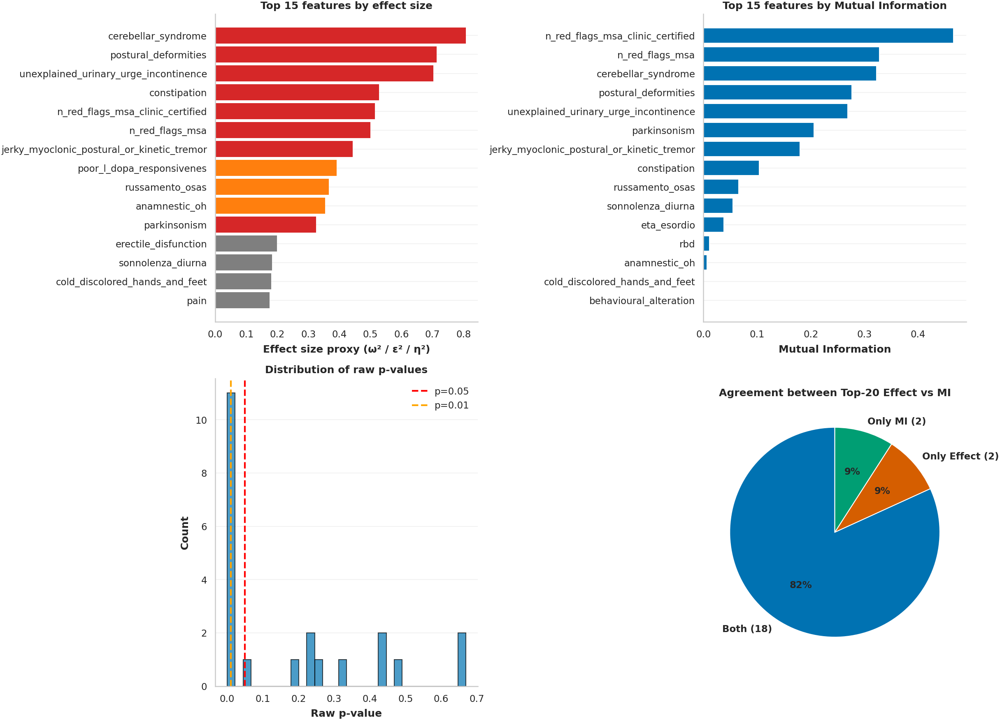

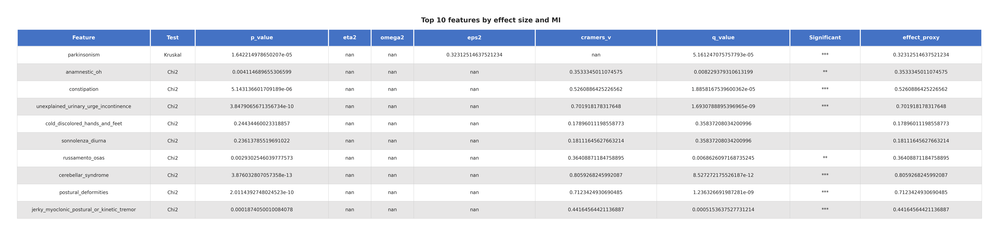


## 14. Differential and Within‑Diagnosis Correlations

- Differential correlations: identify pairs of continouse variables whose association differs between diagnoses.
- Within‑diagnosis correlation heatmaps (MSA‑P, MSA‑C, PD) for key clinical variables.

**Method:**
1. Calculate correlation matrices **separately** for each diagnosis (MSA-P, MSA-C, PD)
2. For each variable pair, compute the **maximum absolute difference** in correlation coefficients across groups:
$$
\text{Max Diff} = \max\big( \; |r_{\text{MSA-P}} - r_{\text{PD}}|,\quad |r_{\text{MSA-C}} - r_{\text{PD}}|,\quad |r_{\text{MSA-P}} - r_{\text{MSA-C}}| \; \big)
$$
3. Rank pairs by Max Diff to identify **most differentially correlated** relationships

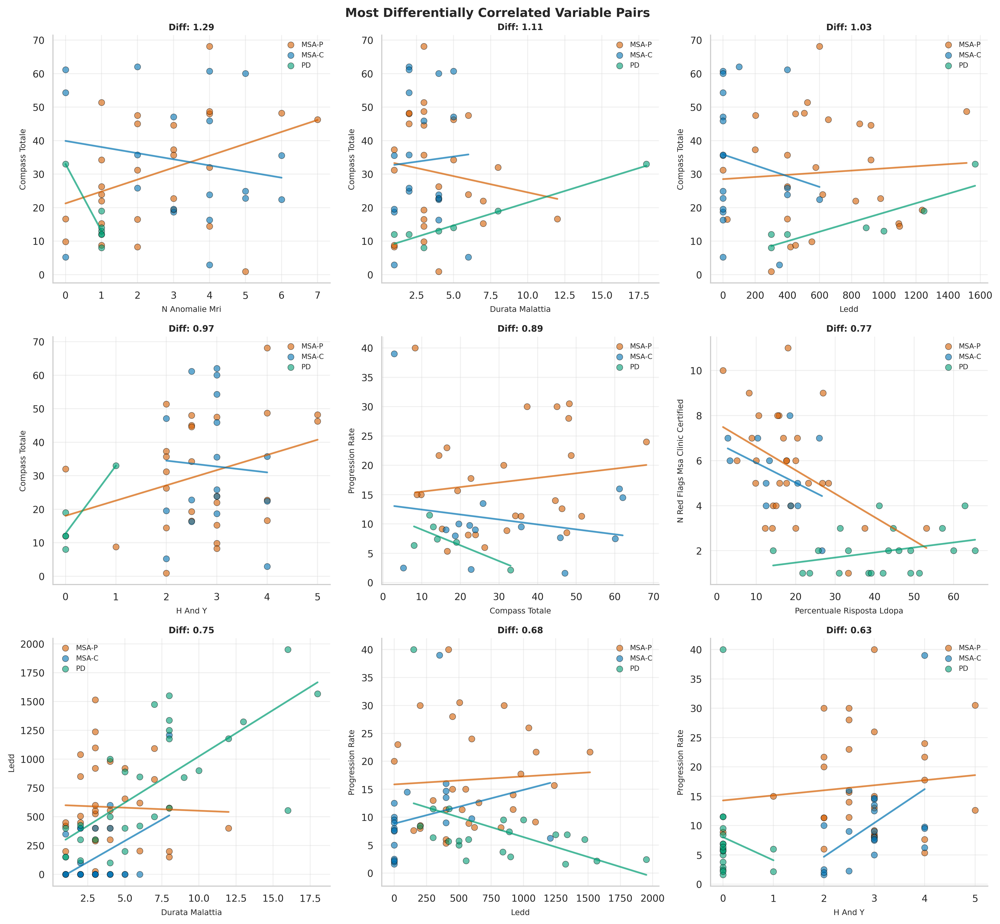

### Main Insights

- **Autonomic–Structural Link**  
  *Compass Totale* increases with *N° Anomalie MRI* only in **MSA-P**, suggesting that structural damage (putamen/cerebellum) parallels autonomic failure — absent in PD.

  strange MSA-C inverse correlation.

- **Disease Duration Effect**  
  *Compass Totale* rises with *Durata Malattia* in in PD and MSA-C indicating **progressive autonomic decline**

  strange  MSA-P inverse relationship


- **Medication Dynamics**  
  - In PD, *LEDD* scales with disease duration (normal titration).  
  - In MSA, higher *LEDD* does **not** improve *Compass Totale* or *Progression Rate* as much as it does for Pd patients consistent with **poor dopaminergic responsiveness** of MSA.

- **Motor–Autonomic Coupling**  
  *H&Y* correlates positively with *Compass Totale* and *Progression Rate* in MSA, but not in PD supporting **parallel motor and autonomic progression** in MSA.

- **Diagnostic Red Flags**  
  Patients with low *% L-dopa response* show more *MSA red flags*, consistent with **poor dopaminergic responsiveness** of MSA.


<div style="background-color: rgba(220, 53, 69, 0.15); border-left: 6px solid #DC3545; padding: 10px; margin: 10px 0; color: inherit;">
<strong>🚨 IMPORTANT:</strong> COMPASS is a high missing value (almost 40%) expecially for PD patients where almost 80% of them do not have a compass value
</div>

## Within diagnosis symptoms correlation (Pearson)

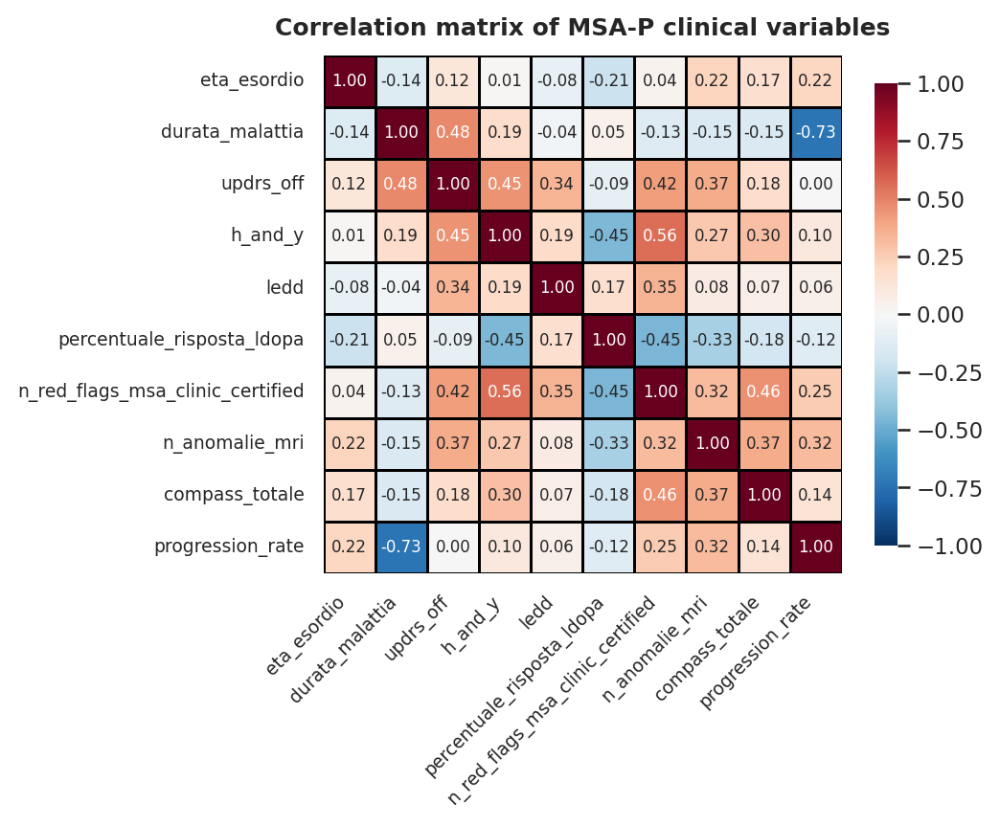
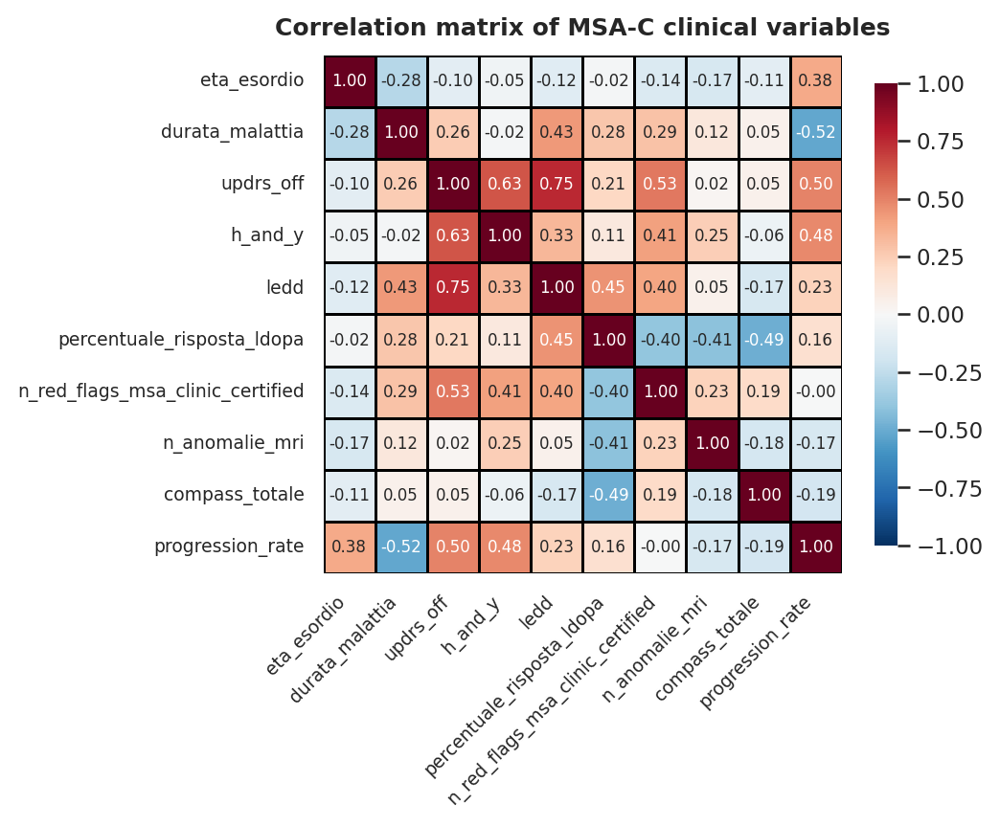
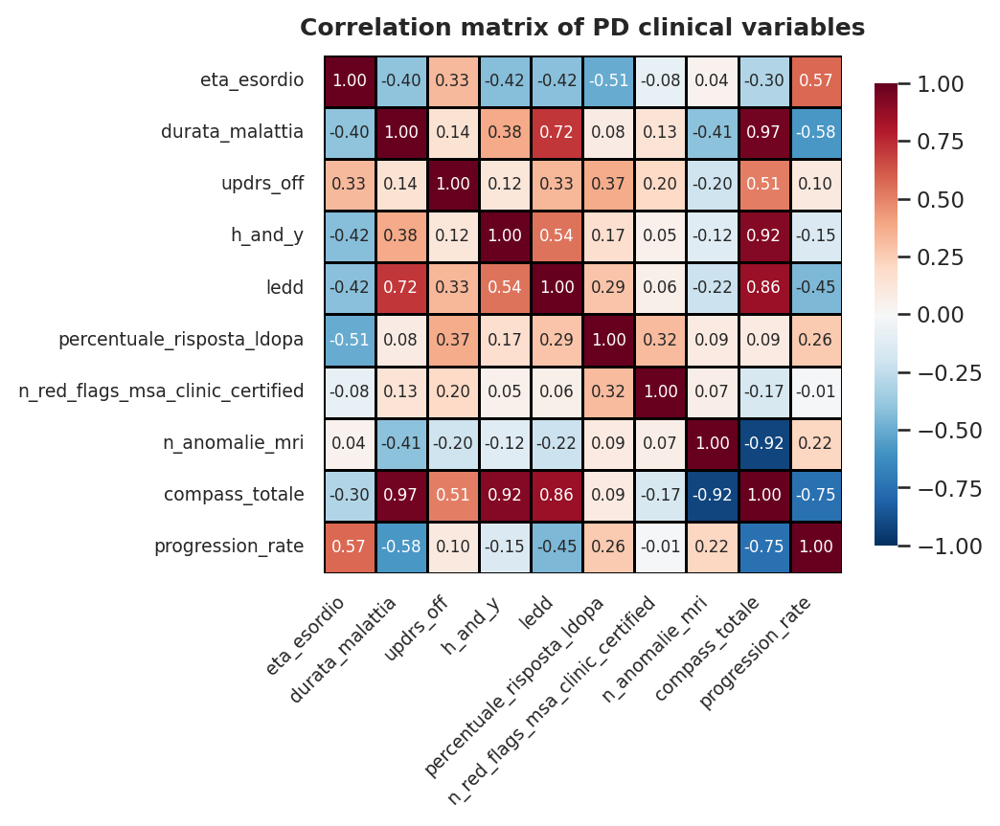

## 15. ML model integration

Highly discriminative easy‑to‑collect features are selected (selected in step 13):

 - 'unexplained_urinary_urge_incontinence'
 - 'russamento_osas'
 - 'anamnestic_oh'
 - 'sonnolenza_diurna'
 - 'cold_discolored_hands_and_feet'
 - 'cerebellar_syndrome'
 - 'postural_deformities'
 - 'parkinsonism'
 - 'constipation'
 - 'jerky_myoclonic_postural_or_kinetic_tremor'

few simple ML/statistical models are used to make predictions.
 - dummy = random guess
 - logistic regression (logreg)
 - random forest (rf)

8 fold cross validation is performed

The **Matthews Correlation Coefficient (MCC)** is included as a key metric for model evaluation instead of f1.
- **MCC** is a balanced measure, even for imbalanced classes, giving a value between -1 (inverse prediction) and +1 (perfect prediction); 0 indicates random performance.


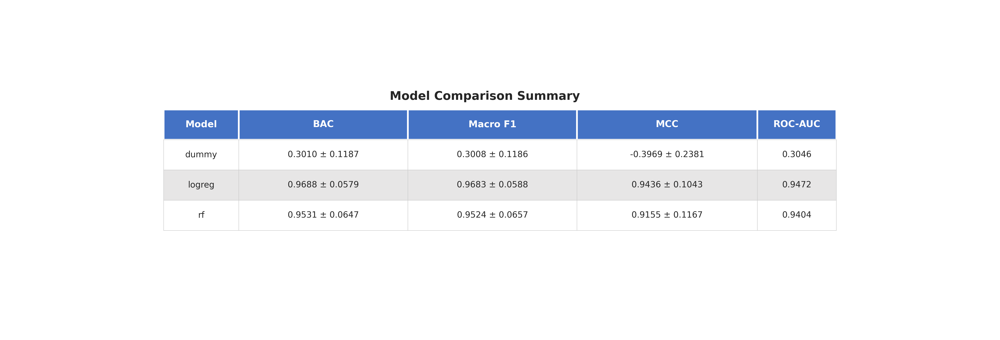


**OUT OF FOLD CONFUSION MATRIX**
aggregates prediction for each test fold data. ie these are the prediction aggregated over each fold test set
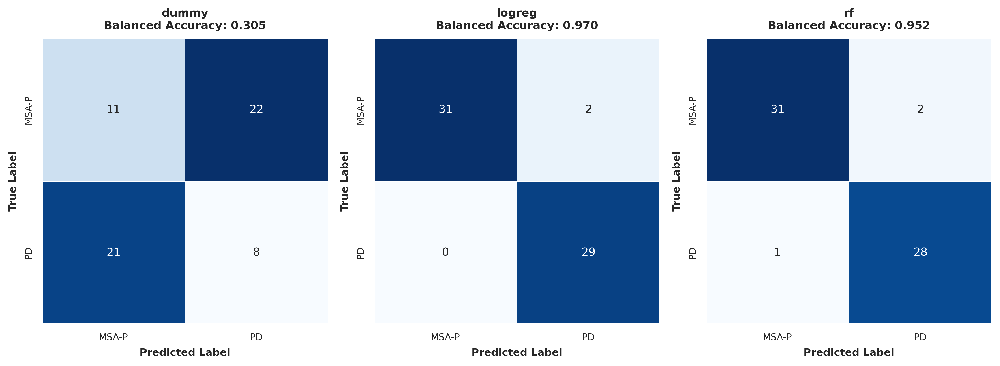

<div style="background-color: rgba(255, 193, 7, 0.15); border-left: 6px solid #FFC107; padding: 10px; margin: 10px 0; color: inherit;">
<strong>⚠️ TODO:</strong> Clinician features review
</div>